<a href="https://colab.research.google.com/github/gulabpatel/Computer_Vision/blob/main/Object_Detection/08_SolarPanelDetectionYOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Solar Panel Detection Using YOLOv8 Object Detection Model

This notebook shows the simplicity of using YOLOv8 on object detection.

### Imports

In [ ]:
!pip install roboflow
!pip install ultralytics

from roboflow import Roboflow
from google.colab import userdata
from ultralytics import YOLO

### Loading the Dataset

In [2]:
rf = Roboflow(api_key="0BeJgd54lC1r8k6c05Qr")
project = rf.workspace("abel-wmljw").project("solar-panels-6jrya")
dataset = project.version(1).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.208, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Solar-panels-1 in yolov8:: 100%|██████████| 258/258 [00:00<00:00, 5885.56it/s]


### Model Training

In [3]:
model = YOLO("yolov8n.pt")
#To see supported tasks and why did I choose yolov8n.pt: https://docs.ultralytics.com/models/yolov8/#supported-tasks

100%|██████████| 6.23M/6.23M [00:00<00:00, 299MB/s]


In [4]:
model.train(data="/content/Solar-panels-1/data.yaml", epochs=30)

Ultralytics YOLOv8.0.208 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Solar-panels-1/data.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=Fals

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x791620a4c760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### TensorBoard

In [5]:
%reload_ext tensorboard
%tensorboard --logdir runs/detect/train

<IPython.core.display.Javascript object>

### Displaying Images

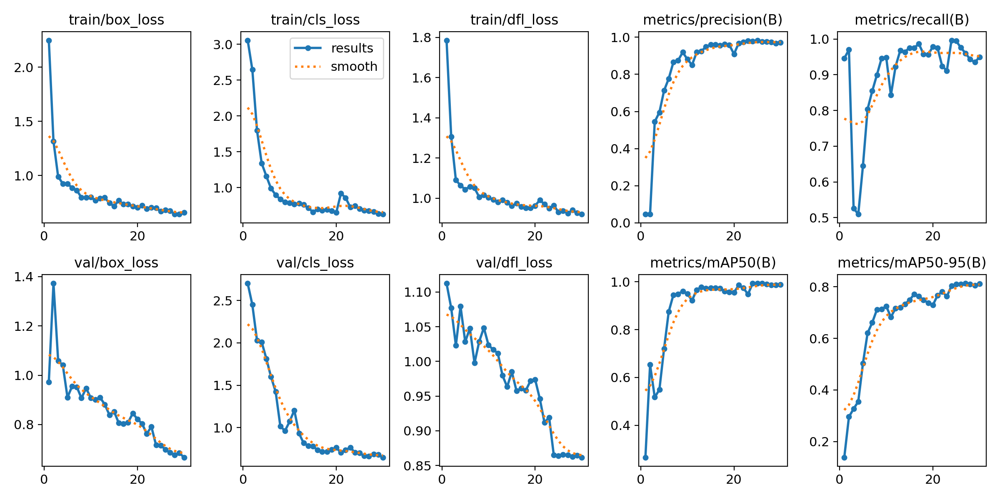

In [6]:
from IPython.display import Image

Image("/content/runs/detect/train/results.png")

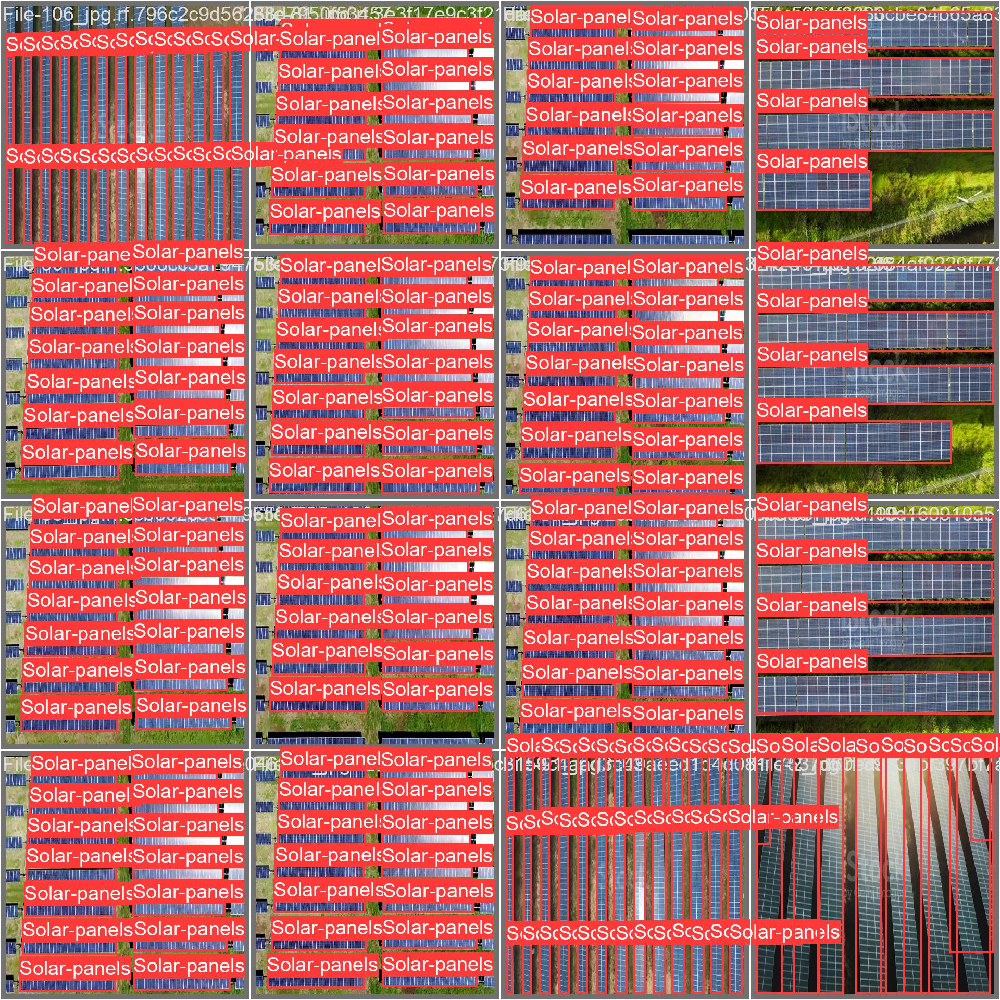

In [7]:
Image("/content/runs/detect/train/val_batch0_labels.jpg")

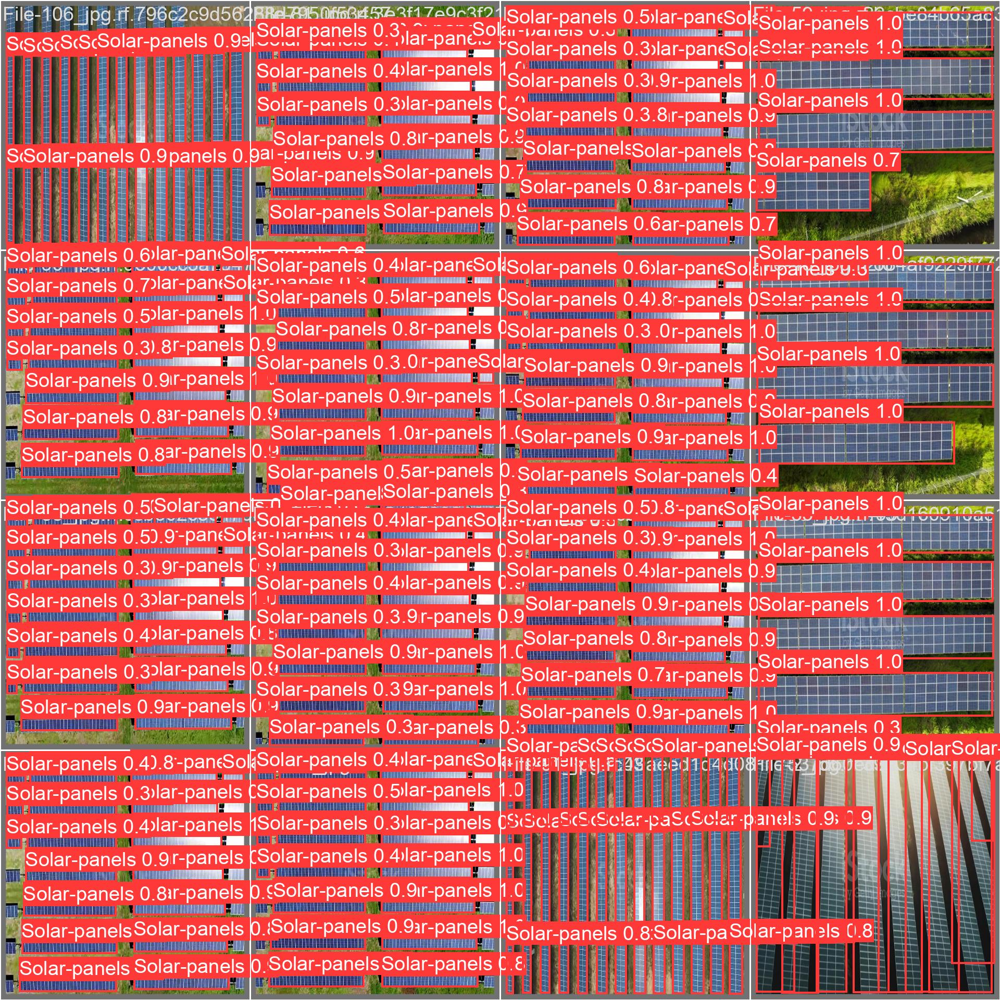

In [8]:
Image("/content/runs/detect/train/val_batch0_pred.jpg")